# Dynamic Network Subgraphs

## Summary

*__Introduction__*

  * Functional organization of the brain is modular. That is, brain regions are organized into functional domains, in which they are strongly connected to each other and weakly connected to brain regions in different functional domains. Modular organization can aid a network in distributing metabolic resources more efficiently amongst nodes.
  
  * The modular organization of a network can change dynamically, perhaps to adapt to changes in network topology. Dynamic reorganization of functinoal brain modules has been associated with ageing, learning, and neurological and psychiatrical diseases.
  
  * Functional brain modules during resting state...
  
*__References__*
  - Bassett, D. S., Wymbs, N. F., Porter, M. A., Mucha, P. J., Carlson, J. M., & Grafton, S. T. (2010). Dynamic reconfiguration of human brain networks during learning. Learning, 108(18), 19. http://doi.org/10.1073/pnas.1018985108
  - Bassett, D. S., Wymbs, N. F., Rombach, M. P., Porter, M. A., Mucha, P. J., & Grafton, S. T. (2013). Task-based core-periphery organization of human brain dynamics. PLoS Computational Biology, 9(9), e1003171. http://doi.org/10.1371/journal.pcbi.1003171.
  - Bassett, D. S., Yang, M., Wymbs, N. F., & Grafton, S. T. (2015). Learning-Induced Autonomy of Sensorimotor Systems. Nature Neuroscience, 18(5), 744–751. http://doi.org/10.1038/nn.3993
  - Sporns, Betzel papers

## Methodology

*__Dynamic Community Detection__*

  * Static and dynamic community detection algorithms assign network nodes into modules by optimizing a modularity quality function, Q, such that:
  
  $Q = \frac{1}{2\mu} \sum_{ijlr}[(A_{ijl} - \gamma_l P_{ijl})\delta_{lr} + \delta_{ij} \omega_{jlr}]
  \delta(g_{il}, g_{jr})$
  
  where, $A$ is an adjacency tensor of size $N \times N \times T$ ($N$ nodes; $T$ time windows), $i$ and $j$ are the $i^\text{th}$ and $j^\text{th}$ nodes, $l$ and $r$ are the $l^\text{th}$ and $r^\text{th}$ time windows, $P$ is a network null model of $A$, $\gamma_l$ is the structural resolution parameter for time window $l$, $\omega_{jlr}$ is the temporal resolution parameter linking node $j$ from time windows $l$ and $r$, $\mu$ is the total network connection strength.
  
*__References__*
  - Bassett, D. S., Porter, M. A., Wymbs, N. F., Grafton, S. T., Carlson, J. M., & Mucha, P. J. (2013). Robust detection of dynamic community structure in networks. Chaos (Woodbury, N.Y.), 23(1), 013142. http://doi.org/10.1063/1.4790830

# Optimize Dynamic Subgraphs

## Initialize Environment

In [1]:
try:
    %load_ext autoreload
    %autoreload 2
    
except:
    print 'NOT IPYTHON'

from __future__ import division
from IPython.display import display

import os
import sys
import glob
import json

import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt
import seaborn as sns

os.chdir('../')
import Codebase

path_CoreData = '/Users/akhambhati/Remotes/hoth_research/CoreData/fMRI_multiband-mmattar/restdata'
path_PeriphData = '/Users/akhambhati/Remotes/hoth_research/PeriphData/ds-NMF_Subnetworks'
path_InpData = path_PeriphData + '/e01-Dyne_FuncNetw'
path_ExpData = path_PeriphData + '/e03-DynFuncSubgraph'

for path in [path_CoreData, path_PeriphData, path_InpData, path_ExpData]:
    if not os.path.exists(path):
        print('Path: {}, does not exist'.format(path))
        os.makedirs(path)

## Generate List of Data

In [ ]:
subj_date = [full_subj_path.split('/')[-1]
             for full_subj_path in glob.iglob('{}/*.dyne_output.hdf'.format(path_InpData))]

subj_ids = {}
for s_d in subj_date:
    subj, date = s_d.split('.')[:2]
    try:
        subj_ids[subj]
    except KeyError:
        subj_ids[subj] = []
    
    subj_ids[subj].append(date)

## Construct Configuration Matrices
*__WARNING: Will Delete Existing Output__*

In [ ]:
# Remove all existing output (retains pipe/pipeline definitions)
rm_outp = glob.glob("{}/*.cfg_matr.npz".format(path_ExpData))

for rm_type in [rm_outp]:
    for path in rm_type:
        try:
            os.remove(path)
        except:
            print("{} not found".format(path))

In [ ]:
conv_adj_matr_to_cfg_matr = Codebase.Networks.configuration.convert_adj_matr_to_cfg_matr

for subj, dates in subj_ids.items():
    
    cfg_matr = []
    for d_i, date in enumerate(dates):
        
        # Input data paths
        log_path = "{}/{}.{}.dyne_log.csv".format(path_InpData,
                                                  subj, date)
        inp_path = "{}/{}.{}.dyne_output.hdf".format(path_InpData,
                                                     subj, date)

        # Read the input data
        df_log = pd.read_csv(log_path, delimiter=',')
        pipe_hash = df_log[df_log.PIPE_NAME == 'MTCoh'].DOWNSTREAM_HASH[0]
        
        df_inp = h5py.File(inp_path, 'r')
        inp_dat = df_inp[pipe_hash]['data'][...]
        inp_meta = df_inp[pipe_hash]['meta']

        for cfg_vec in conv_adj_matr_to_cfg_matr(inp_dat):
            cfg_matr.append(cfg_vec)
                
    # Cache the modularity matrices
    cfg_matr = np.array(cfg_matr)
    np.savez("{}/{}.cfg_matr.npz".format(path_ExpData, subj),
             cfg_matr=cfg_matr)

## Parameter Search Space

In [ ]:
# Set search ranges
search_alpha_log = [0.01, 2.0]
search_beta_log = [0.01, 2.0]
search_rank = [2, 21]
n_search = 30000

# Generate parameter set
param_set = []
param_alpha = np.zeros(n_search)
param_beta = np.zeros(n_search)
param_rank = np.zeros(n_search)
for ii in xrange(n_search):
    alpha = np.random.uniform(low=search_alpha_log[0],
                              high=search_alpha_log[1])

    beta = np.random.uniform(low=search_beta_log[0],
                             high=search_beta_log[1])
    
    rank = np.random.randint(low=search_rank[0],
                             high=search_rank[1])
    
    param_alpha[ii] = alpha
    param_beta[ii] = beta
    param_rank[ii] = rank
    param_set.append({'alpha': alpha,
                      'beta': beta,
                      'rank': rank})

    
# Display Joint-Distributions Parameter Space
%matplotlib inline
g = sns.jointplot(param_alpha, param_beta, kind='kde')
g.set_axis_labels('Alpha', 'Beta')

g = sns.jointplot(param_alpha, param_rank, kind='kde')
g.set_axis_labels('Alpha', 'Rank')

g = sns.jointplot(param_beta, param_rank, kind='kde')
g.set_axis_labels('Beta', 'Rank')

## Run Non-Negative Matrix Factorization Algorithm
*__WARNING: Will Delete Existing Output__*

In [ ]:
# Remove all existing output (retains pipe/pipeline definitions)
rm_outp = glob.glob("{}/subgraph_param_opt-*.npz".format(path_ExpData))

for rm_type in [rm_outp]:
    for path in rm_type:
        try:
            os.remove(path)
        except:
            print("{} not found".format(path))

In [ ]:
from Codebase.Networks.SubgraphDetection.nonnegfac import nmf

from multiprocessing import Pool
parallel_run = True

# Associate param search with a randomly chosen subject
subj_cfgmatr_path = glob.glob("{}/*.cfg_matr.npz".format(path_ExpData))
proc_list = []
for ii, param in enumerate(param_set):
    path = np.random.permutation(subj_cfgmatr_path)[0]
    proc_list.append((ii+1, param, path))
    
# Setup helper function to map pipeline run
def _nmf_helper(proc_item):
    ii, param, inp_path = proc_item
    
    # Load the file
    #if os.path.exists(inp_path):
    #    return 0
    print(" -- Processing: {}, with Parameter: {}".format(inp_path.split('/')[-1],
                                                          ii))
    data = np.load(inp_path, mmap_mode='r')
    
    # Initialize the factors for NMF
    fac_subnet = np.random.uniform(low=0, high=1.0,
                                   size=(param['rank'],
                                         data['cfg_matr'].shape[1]))
    fac_coef = np.random.uniform(low=0, high=1.0,
                                 size=(param['rank'],
                                       data['cfg_matr'].shape[0]))

    # Run NMF Algorithm
    fac_subnet, fac_coef, err = nmf.snmf_bcd(
        data['cfg_matr'],
        alpha=param['alpha'], beta=param['beta'],
        fac_subnet_init=fac_subnet,
        fac_coef_init=fac_coef,
        max_iter=100, verbose=False)
    
    # Cache the NMF result
    np.savez("{}/subgraph_param_opt-{}.npz".format(path_ExpData, ii),
             fac_subnet=fac_subnet, fac_coef=fac_coef, err=err,
             param=param, path=path)

if parallel_run:
    mp = Pool(7)
    mp.map(_nmf_helper, proc_list)
else:
    map(_nmf_helper, proc_list)

## Analyze Parameter Search Space

In [2]:
import scipy.stats as stats

param_run = glob.glob("{}/subgraph_param_opt-*.npz".format(path_ExpData))
n_param = len(param_run)

param_alpha = np.zeros(n_param)
param_beta = np.zeros(n_param)
param_rank = np.zeros(n_param)

err = np.zeros(n_param)
subnet_sparsity = np.zeros(n_param)
coef_sparsity = np.zeros(n_param)

ii = 0
for path in param_run:
    data = np.load(path, mmap_mode='r')
    param = data['param'][()]
    
    param_alpha[ii] = param['alpha']
    param_beta[ii] = param['beta']
    param_rank[ii] = param['rank']

    err[ii] = data['err'][-1]
    subnet_sparsity[ii] = (data['fac_subnet'] == 0).mean()
    coef_sparsity[ii] = (data['fac_coef'] == 0).mean()
    
    ii += 1

param_alpha = param_alpha[:ii]
param_beta = param_beta[:ii]
param_rank = param_rank[:ii]

err = err[:ii]
subnet_sparsity = subnet_sparsity[:ii]
coef_sparsity = coef_sparsity[:ii]

### Display Parameter Search Space

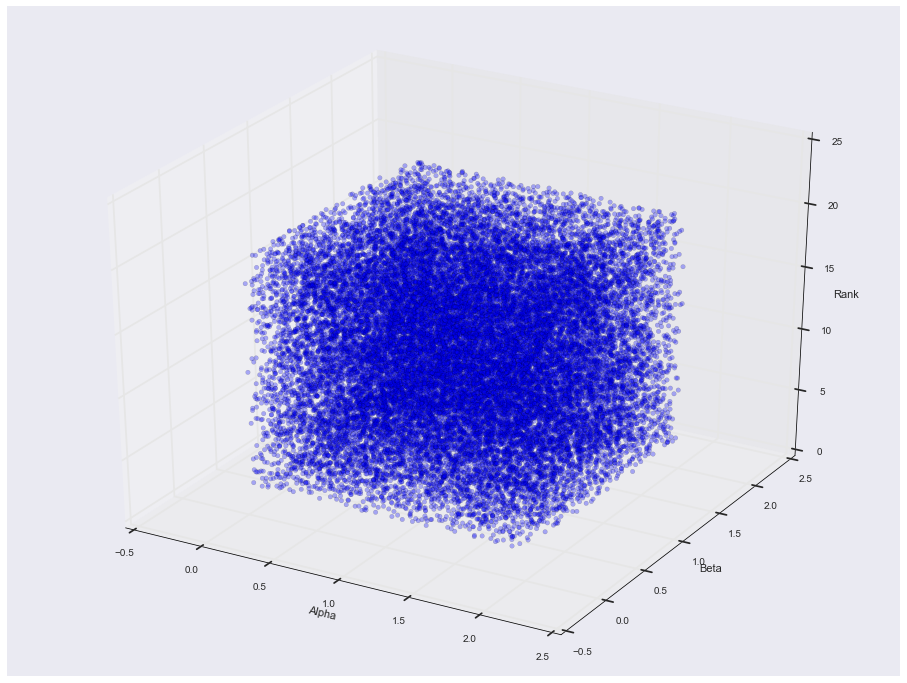

In [68]:
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(param_alpha, param_beta, param_rank, alpha=0.3)
ax.set_xlabel('Alpha')
ax.set_ylabel('Beta')
ax.set_zlabel('Rank')

### Display Relationship Between Parameters and Quality Measures

Plotting -- Residual Error
Plotting -- Pct Subgraph Sparse
Plotting -- Pct Coef Sparse


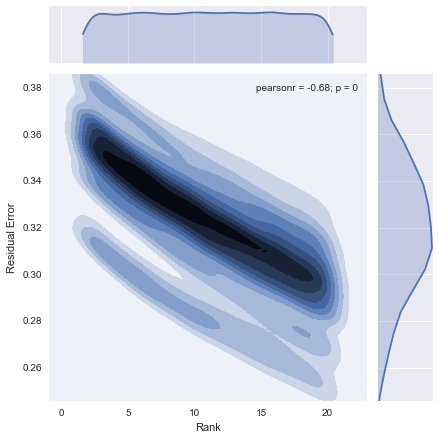

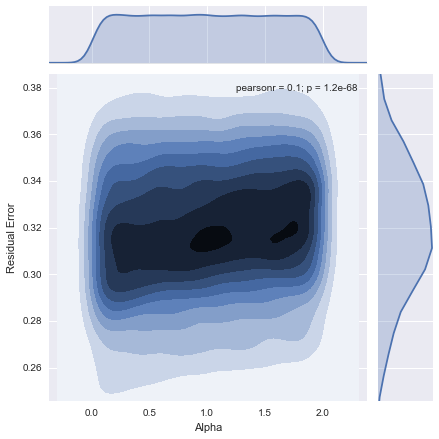

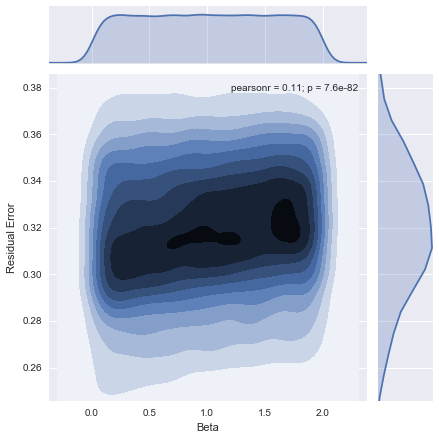

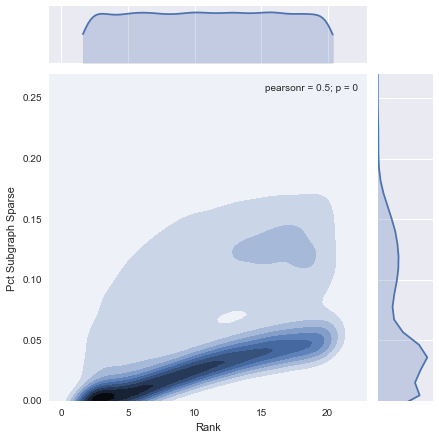

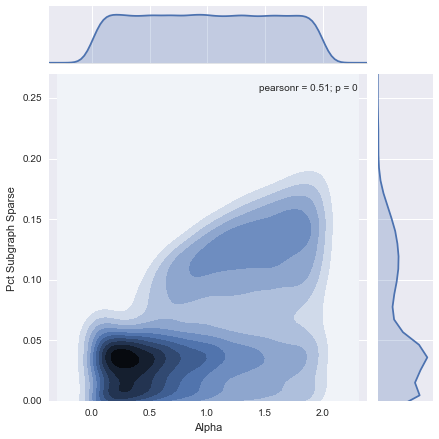

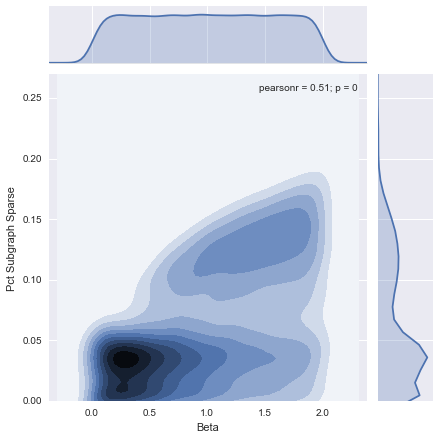

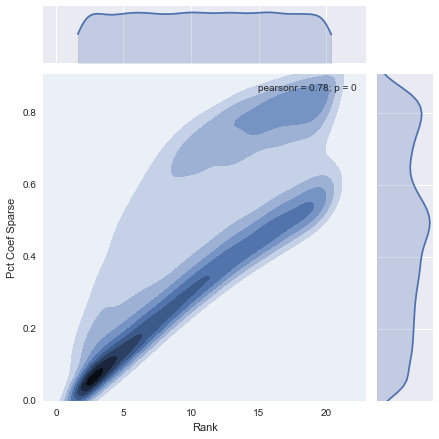

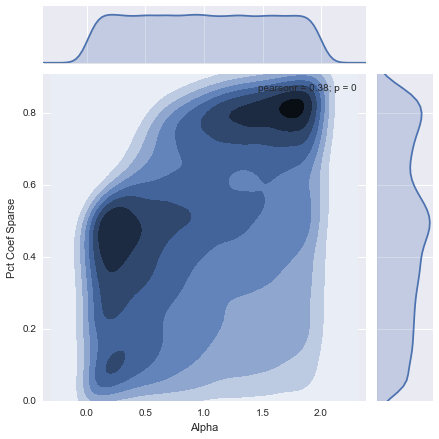

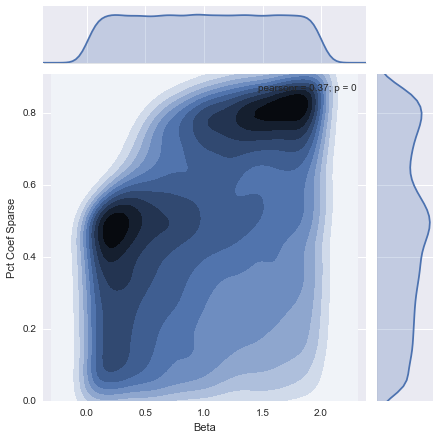

In [70]:
%matplotlib inline

for qmeas, qname in [(err, 'Residual Error'),
                     (subnet_sparsity, 'Pct Subgraph Sparse'),
                     (coef_sparsity, 'Pct Coef Sparse')]:
    print('Plotting -- {}'.format(qname))
    
    g = sns.jointplot(param_rank, qmeas, kind='kde',
                       ylim=[np.min(qmeas), np.max(qmeas)])
    g.set_axis_labels('Rank', qname)

    g = sns.jointplot((param_alpha), qmeas, kind='kde',
                       ylim=[np.min(qmeas), np.max(qmeas)])
    g.set_axis_labels('Alpha', qname)

    g = sns.jointplot((param_beta), qmeas, kind='kde',
                       ylim=[np.min(qmeas), np.max(qmeas)])
    g.set_axis_labels('Beta', qname)

### Display Bivariate Distribution of Error and Sparsity

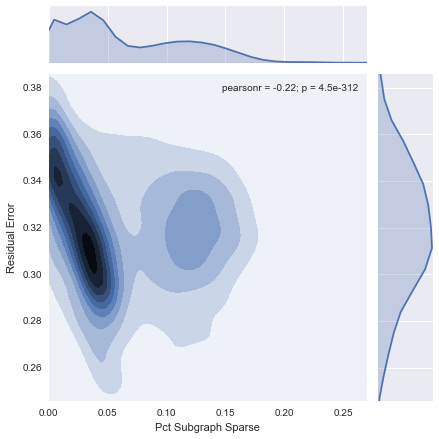

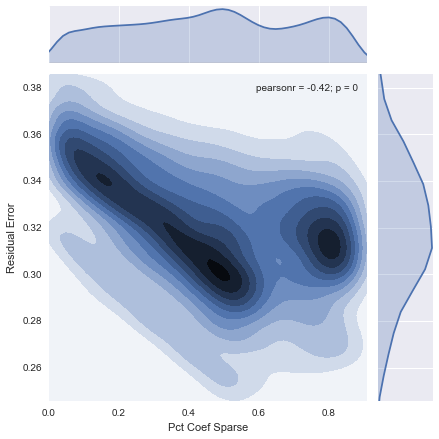

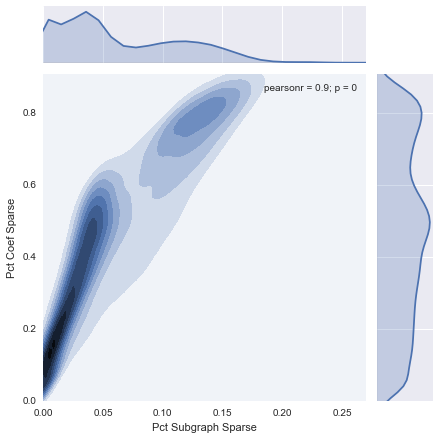

In [71]:
g = sns.jointplot(subnet_sparsity, err, kind='kde',
                  xlim=[np.min(subnet_sparsity), np.max(subnet_sparsity)],
                  ylim=[np.min(err), np.max(err)])
g.set_axis_labels('Pct Subgraph Sparse', 'Residual Error')

g = sns.jointplot(coef_sparsity, err, kind='kde',
                  xlim=[np.min(coef_sparsity), np.max(coef_sparsity)],
                  ylim=[np.min(err), np.max(err)])
g.set_axis_labels('Pct Coef Sparse', 'Residual Error')

g = sns.jointplot(subnet_sparsity, coef_sparsity, kind='kde',
                  xlim=[np.min(subnet_sparsity), np.max(subnet_sparsity)],
                  ylim=[np.min(coef_sparsity), np.max(coef_sparsity)])
g.set_axis_labels('Pct Subgraph Sparse', 'Pct Coef Sparse')

### Find Optimal Parameters

Minimize the residual error and maximize subgraph and temporal coefficient sparsity

In [72]:
# Specify ranges
err_range = [np.percentile(err, 0), np.percentile(err, 25)]
subnet_sparsity_range = [np.percentile(subnet_sparsity, 75), np.percentile(subnet_sparsity, 100)]
coef_sparsity_range = [np.percentile(coef_sparsity, 75), np.percentile(coef_sparsity, 100)]

err_ix = np.flatnonzero((err >= err_range[0]) & (err <= err_range[1]))
subnet_sparsity_ix = np.flatnonzero((subnet_sparsity >= subnet_sparsity_range[0]) &
                                    (subnet_sparsity <= subnet_sparsity_range[1]))
coef_sparsity_ix = np.flatnonzero((coef_sparsity >= coef_sparsity_range[0]) &
                                    (coef_sparsity <= coef_sparsity_range[1]))

param_ix = np.intersect1d(np.intersect1d(err_ix, subnet_sparsity_ix), coef_sparsity_ix)
n_param = len(param_ix)

print('Alpha: {} +/- {}'.format(np.mean(param_alpha[param_ix]),
                                np.std(param_alpha[param_ix]) / np.sqrt(n_param)))
print('Beta: {} +/- {}'.format(np.mean(param_beta[param_ix]),
                               np.std(param_beta[param_ix]) / np.sqrt(n_param)))
print('Rank: {} +/- {}'.format(np.mean(param_rank[param_ix]),
                               np.std(param_rank[param_ix]) / np.sqrt(n_param)))

Alpha: 1.36852679246 +/- 0.00954609840187
Beta: 1.38259027296 +/- 0.00978854709068
Rank: 16.6436851739 +/- 0.0727663476459


# Detect Dynamic Subgraphs

## Initialize Environment

In [ ]:
try:
    %load_ext autoreload
    %autoreload 2
    
except:
    print 'NOT IPYTHON'

from __future__ import division
from IPython.display import display

import os
import sys
import glob
import json

import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt
import seaborn as sns

os.chdir('../')
import Codebase

path_CoreData = '/Users/akhambhati/Remotes/hoth_research/CoreData/fMRI_multiband-mmattar/restdata'
path_PeriphData = '/Users/akhambhati/Remotes/hoth_research/PeriphData/ds-NMF_Subnetworks'
path_InpData = path_PeriphData + '/e01-Dyne_FuncNetw'
path_ExpData = path_PeriphData + '/e03-DynFuncSubgraph'

for path in [path_CoreData, path_PeriphData, path_InpData, path_ExpData]:
    if not os.path.exists(path):
        print('Path: {}, does not exist'.format(path))
        os.makedirs(path)

## Run Non-Negative Matrix Factorization Algorithm
*__WARNING: Will Delete Existing Output__*

In [ ]:
# Remove all existing output (retains pipe/pipeline definitions)
rm_outp = glob.glob("{}/*.subgraph_seed-*.npz".format(path_ExpData))

for rm_type in [rm_outp]:
    for path in rm_type:
        try:
            os.remove(path)
        except:
            print("{} not found".format(path))

In [ ]:
param = {'rank': 16,
         'alpha': 1.37,
         'beta': 1.38}
n_seed = 100

from Codebase.Networks.SubgraphDetection.nonnegfac import nmf
from multiprocessing import Pool
parallel_run = True

# Generate a processing joblist
subj_cfgmatr_path = glob.glob("{}/*.cfg_matr.npz".format(path_ExpData))
proc_list = []
for seed in xrange(n_seed):
    for path in subj_cfgmatr_path:
        subj_name = path.split('/')[-1].split('.')[0]
        proc_list.append({'subj_name': subj_name,
                          'path': path,
                          'param': param,
                          'seed': seed+1})
    
# Setup helper function to map pipeline run
def _nmf_helper(proc_item):
    
    # Load the file
    #if os.path.exists(inp_path):
    #    return 0
    print(" -- Processing: {}, with Parameter: {}".format(proc_item['subj_name'],
                                                          proc_item['seed']))
    data = np.load(proc_item['path'], mmap_mode='r')
    
    # Initialize the factors for NMF
    fac_subnet = np.random.uniform(low=0, high=1.0,
                                   size=(proc_item['param']['rank'],
                                         data['cfg_matr'].shape[1]))
    fac_coef = np.random.uniform(low=0, high=1.0,
                                 size=(proc_item['param']['rank'],
                                       data['cfg_matr'].shape[0]))

    # Run NMF Algorithm
    fac_subnet, fac_coef, err = nmf.snmf_bcd(
        data['cfg_matr'],
        alpha=proc_item['param']['alpha'],
        beta=proc_item['param']['beta'],
        fac_subnet_init=fac_subnet,
        fac_coef_init=fac_coef,
        max_iter=100, verbose=False)
    
    # Cache the NMF result
    np.savez("{}/{}.subgraph_seed-{}.npz".format(path_ExpData,
                                                 proc_item['subj_name'],
                                                 proc_item['seed']),
             fac_subnet=fac_subnet, fac_coef=fac_coef, err=err,
             param=proc_item['param'], path=proc_item['path'])

if parallel_run:
    mp = Pool(7)
    mp.map(_nmf_helper, proc_list)
else:
    map(_nmf_helper, proc_list)

# Statistics on Dynamic Subgraphs

## Initialize Environment

In [1]:
try:
    %load_ext autoreload
    %autoreload 2
    
except:
    print 'NOT IPYTHON'

from __future__ import division
from IPython.display import display

import os
import sys
import glob
import json

import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt

os.chdir('../')
import Codebase

path_CoreData = '/Users/akhambhati/Remotes/hoth_research/CoreData/fMRI_multiband-mmattar/restdata'
path_PeriphData = '/Users/akhambhati/Remotes/hoth_research/PeriphData/ds-NMF_Subnetworks'
path_InpData = path_PeriphData + '/e01-Dyne_FuncNetw'
path_ExpData = path_PeriphData + '/e03-DynFuncSubgraph'

for path in [path_CoreData, path_PeriphData, path_InpData, path_ExpData]:
    if not os.path.exists(path):
        print('Path: {}, does not exist'.format(path))
        os.makedirs(path)

## Generate List of Data

In [2]:
subj_ids = np.unique([full_subj_path.split('/')[-1].split('.')[0]
                      for full_subj_path in glob.iglob('{}/*.subgraph_seed-*.npz'.format(path_ExpData))])

subj_seeds = {}
for subj in subj_ids:
    subj_seeds[subj] = {'seed_path': [full_subj_path
                                      for full_subj_path in glob.iglob('{}/{}.subgraph_seed-*.npz'.format(path_ExpData, subj))],
                        'cfg_path': '{}/{}.cfg_matr.npz'.format(path_ExpData, subj)}

## Consensus Dynamic Subgraphs

In [46]:
from Codebase.Networks.SubgraphDetection.nonnegfac import nmf

for ii, (subj, paths) in enumerate(subj_seeds.items()):
    print(" -- Processing: {}".format(subj))
    
    fac_subnet_seeds = []
    for ix, path in enumerate(paths['seed_path']):
        data = np.load(path, mmap_mode='r')
        fac_subnet = data['fac_subnet'][:, :]
        data.close()
        
        n_fac = fac_subnet.shape[0]
        n_conn = fac_subnet.shape[1]

        for ix in xrange(fac_subnet.shape[0]):
            fac_subnet_seeds.append(fac_subnet[ix, :])
    fac_subnet_seeds = np.array(fac_subnet_seeds)
    
    n_obs = fac_subnet_seeds.shape[0]
    n_conn = fac_subnet_seeds.shape[1]

    # Consensus Subgraphs
    fac_cons_subnet, fac_cons_seeds, err = nmf.snmf_bcd(
        fac_subnet_seeds,
        alpha=0.0,
        beta=0.0,
        fac_subnet_init=np.random.uniform(low=0.0, high=1.0, size=(n_fac, n_conn)),
        fac_coef_init=np.random.uniform(low=0.0, high=1.0, size=(n_fac, n_obs)),
        max_iter=100, verbose=False)
    
    # Consensus Coefficients
    data_cfg = np.load(paths['cfg_path'], mmap_mode='r')
    n_win = data_cfg['cfg_matr'].shape[0]
    fac_cons_subnet_2, fac_cons_coef_2, err = nmf.snmf_bcd(
        data_cfg['cfg_matr'],
        alpha=0.0,
        beta=0.0,
        fac_subnet_init=fac_cons_subnet,
        fac_coef_init=np.random.uniform(low=0.0, high=1.0, size=(n_fac, n_win)),
        max_iter=100, verbose=False)
    
    # Cache the Consensus NMF result
    np.savez("{}/{}.consensus_subgraph.npz".format(path_ExpData,
                                                   subj),
             fac_subnet=fac_cons_subnet_2, fac_coef=fac_cons_coef_2, err=err)

 -- Processing: h010615p
 -- Processing: j032315w
 -- Processing: A010615C
 -- Processing: b031615b
 -- Processing: a012615k
 -- Processing: d011215h
 -- Processing: a022315k
 -- Processing: b020315b
 -- Processing: k031615k
 -- Processing: m020915s
 -- Processing: s031015v
 -- Processing: n032315o
 -- Processing: H020915Z
 -- Processing: m011215c
 -- Processing: a020315s
 -- Processing: h022315k
 -- Processing: m030215g
 -- Processing: M030215R
 -- Processing: j030915h
 -- Processing: b012615o


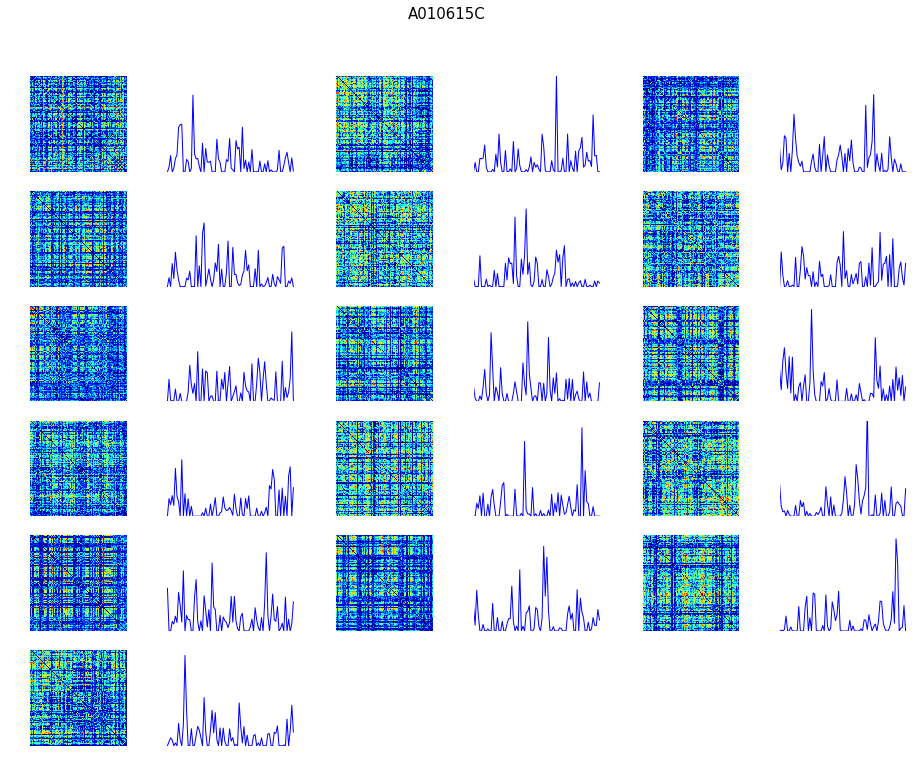

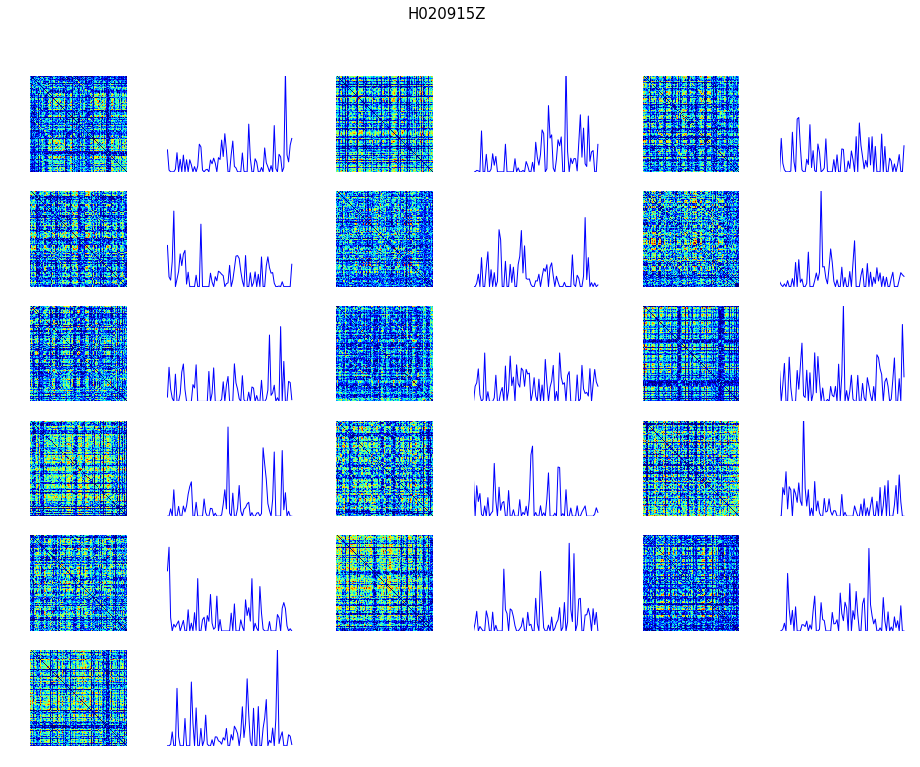

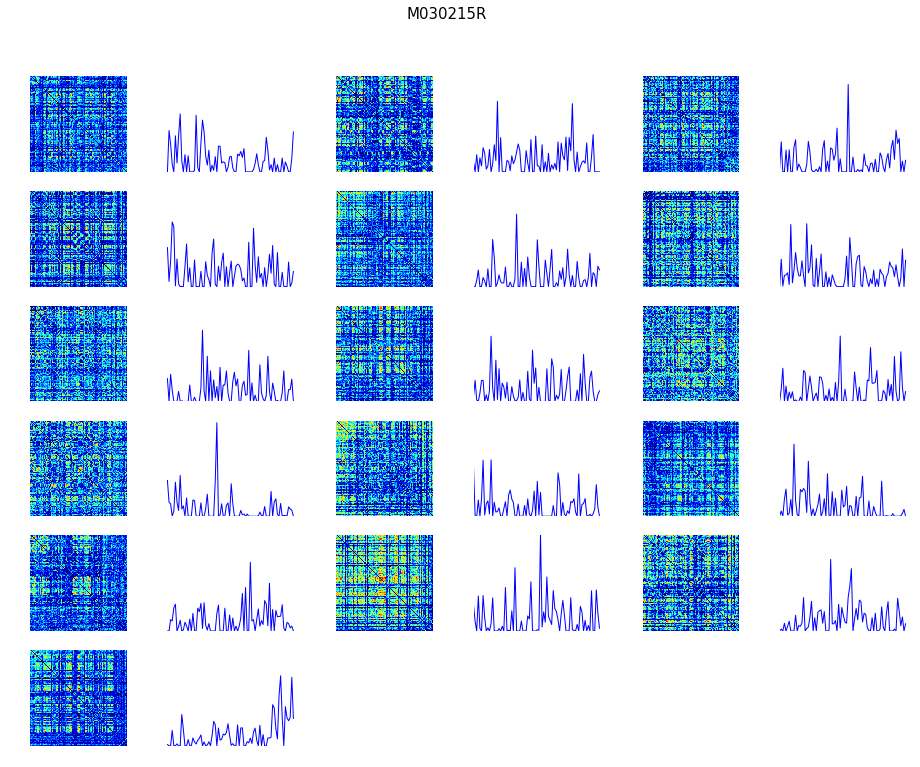

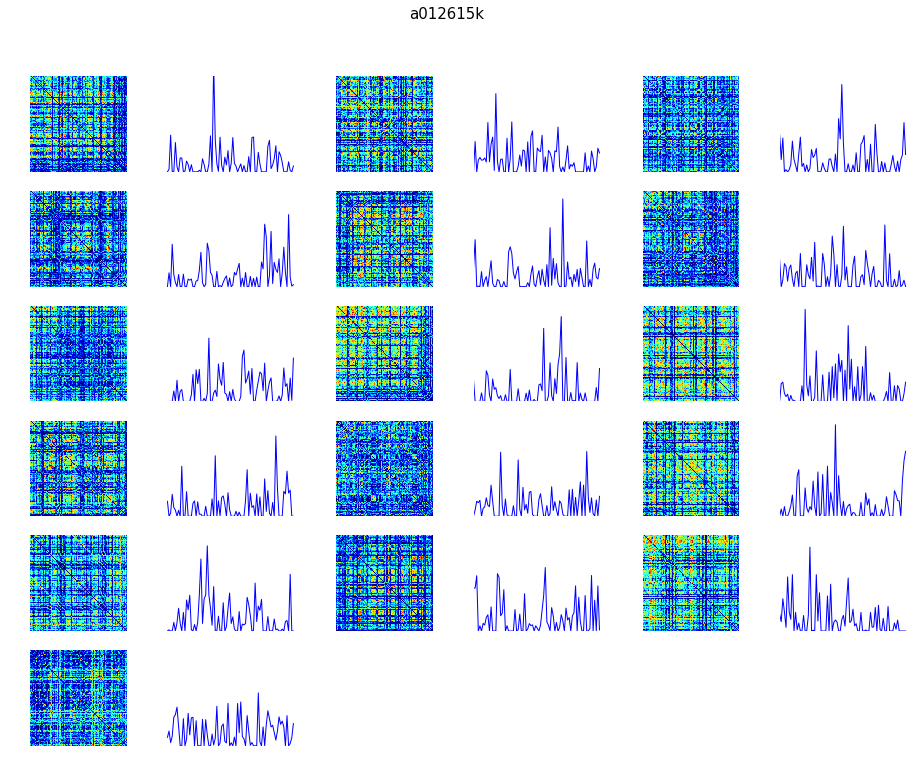

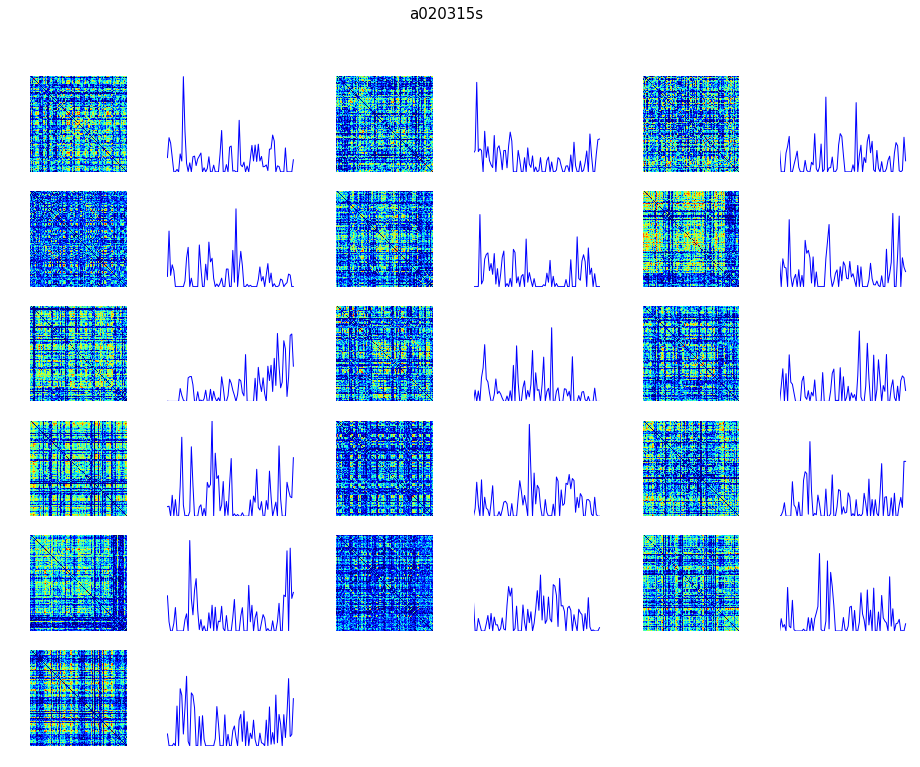

...

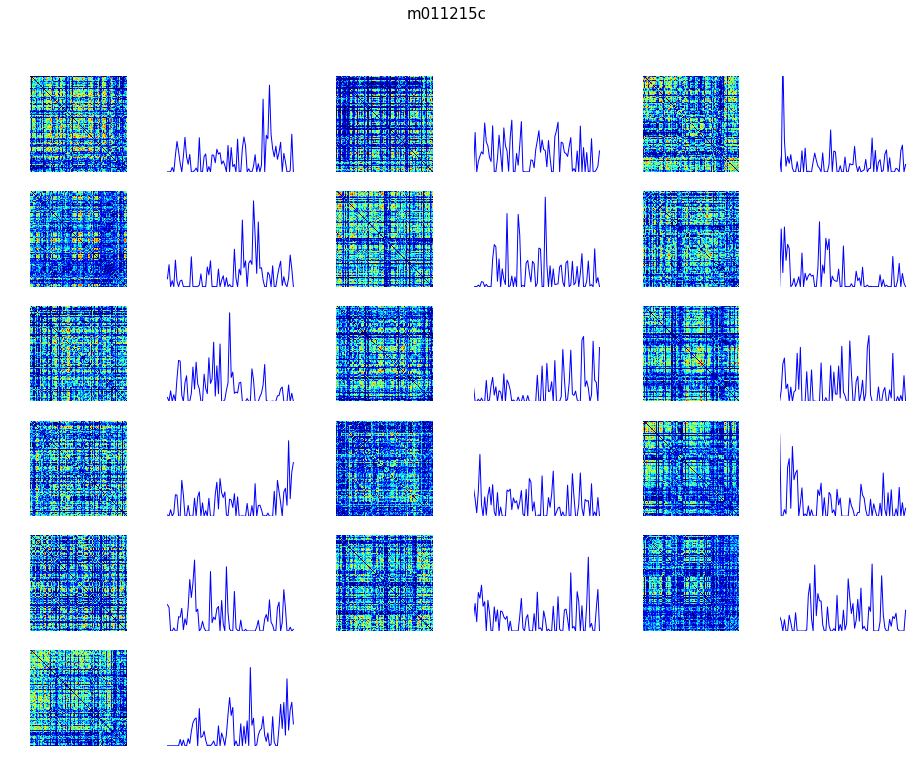

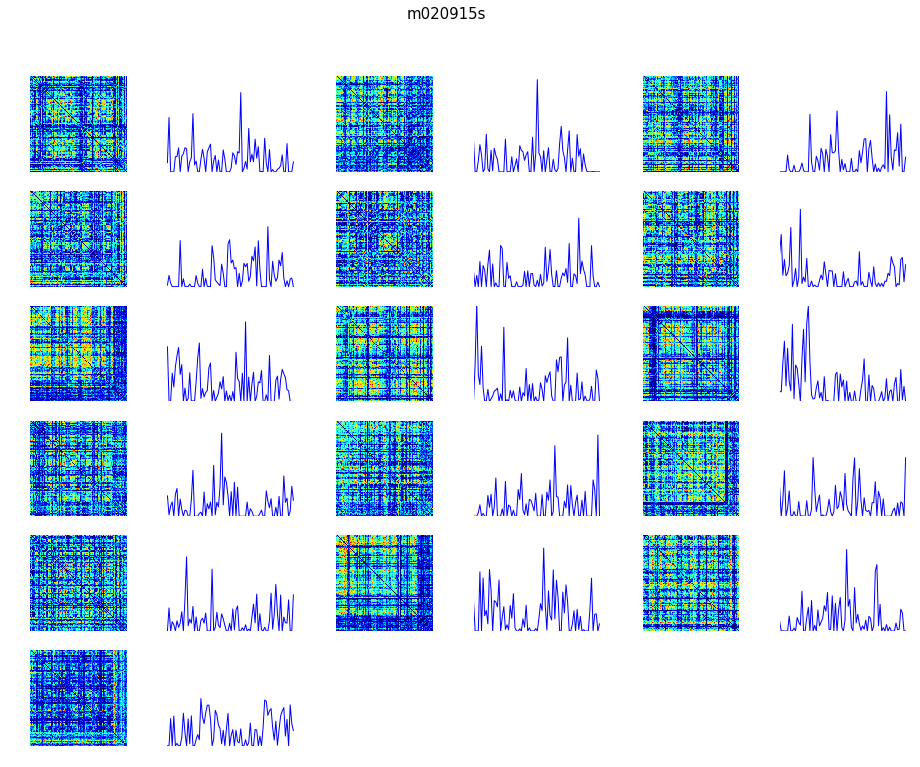

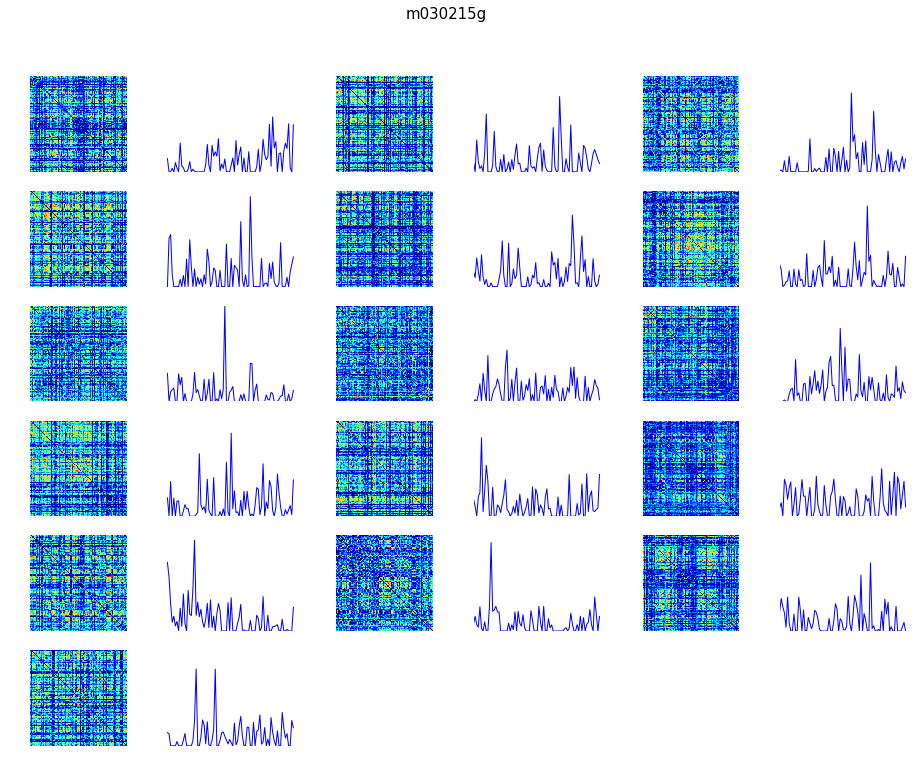

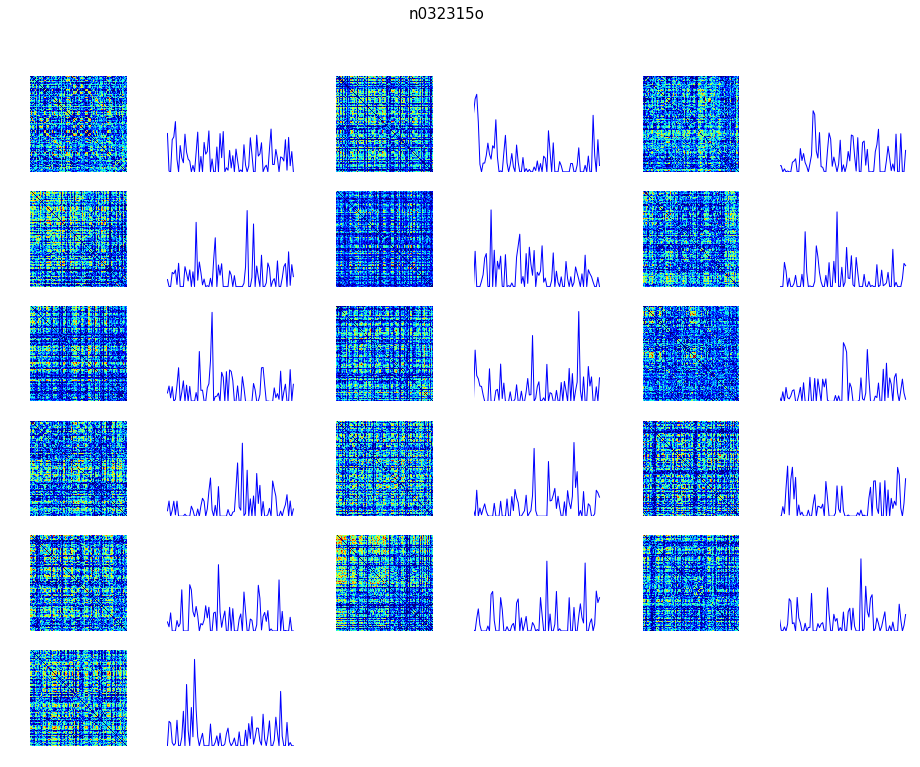

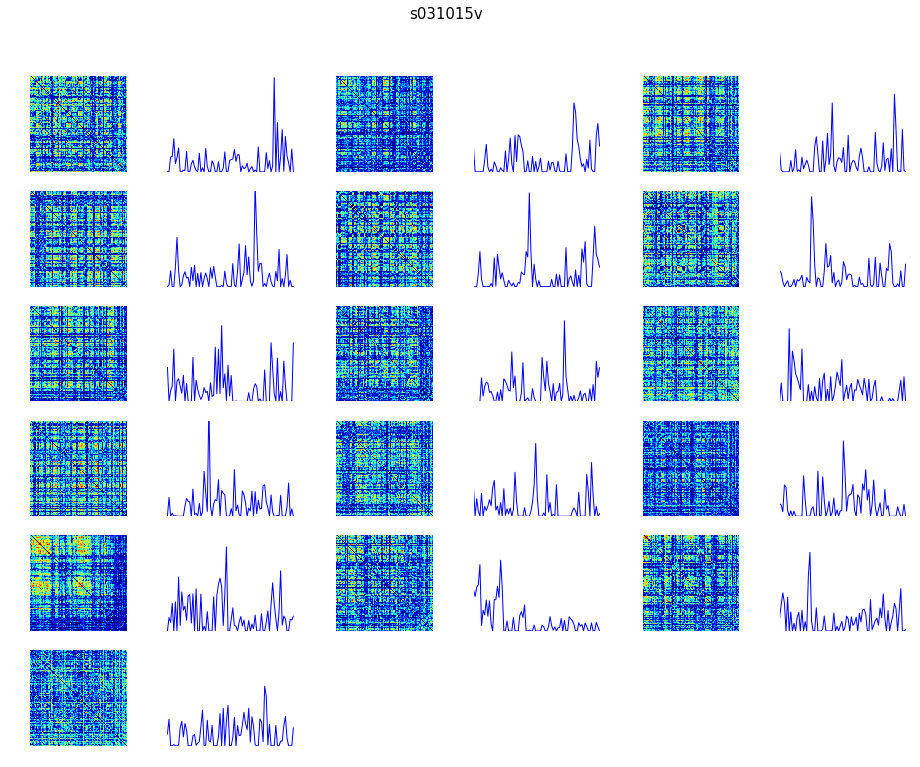

In [3]:
%matplotlib inline

for ss in subj_ids:
    data = np.load("{}/{}.consensus_subgraph.npz".format(path_ExpData, ss),
                   mmap_mode='r')
    fac_subnet = data['fac_subnet']
    fac_coef = data['fac_coef']

    n_fac = 2*fac_subnet.shape[0]
    n_row = 6
    n_col = int(np.ceil(n_fac/n_row))

    plt.figure(figsize=(16, 12))
    ix = 0
    for ii in range(0, n_fac, 2):
        ax = plt.subplot(n_row, n_col, ii+1)
        mat = ax.matshow(Codebase.Networks.configuration.convert_conn_vec_to_adj_matr(fac_subnet[ix, :]),)
        ax.set_axis_off()

        ax = plt.subplot(n_row, n_col, ii+2)
        ax.plot(fac_coef[ix, :])
        ax.set_axis_off()
        ax.set_ylim([0, 20])

        ix += 1
    plt.suptitle(ss, fontsize=15)